In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import PIL
from PIL import Image
import time
import torch.nn as nn
# %matplotlib inline
import os
import torch
from torch.autograd import Variable
import math
dtype = torch.cuda.FloatTensor


In [2]:
base_dir = 'inpainting_dataset/'
img = base_dir+'justin.png'
mask = base_dir+'justin_mask.png'

In [3]:
def preprocess_input(img, mask):
    img = Image.open(img)
    plt.imshow(img)
    mask = Image.open(mask)
    plt.figure()
    plt.imshow(mask,cmap='gray')
    img = np.array(img).transpose(2,0,1)
    img = img[:3,:512,:512]/255
    mask = np.array(mask)[None, :]/255
    processed_img = img*mask
    plt.figure()
    plt.imshow(processed_img.transpose(1,2,0))
    img = (torch.from_numpy(img)[None,:]).type(dtype)
    mask = (torch.from_numpy(mask)[None,:]).type(dtype)
    processed_img = (torch.from_numpy(processed_img)[None,:]).type(dtype)
    return img, mask, processed_img 

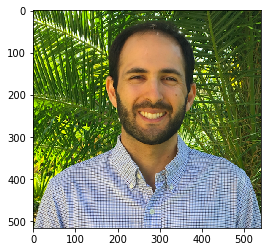

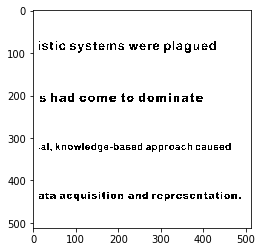

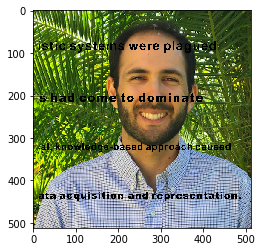

In [4]:
img, mask, processed_img = preprocess_input(img, mask)

In [21]:
def add_module(self, module):
    self.add_module(str(len(self) + 1), module)
    
torch.nn.Module.add = add_module

class Concat(nn.Module):
    def __init__(self, dim, skip, deeper):
        super(Concat, self).__init__()
        self.dim = dim
        self.layer1 = skip
        self.layer2 = deeper
    def forward(self, input):
        inputs = []
        inputs.append(self.layer1(input))
        inputs.append(self.layer2(input))
        return torch.cat(inputs, dim=self.dim)

def act(activation_method = 'LeakyReLU'):
    if activation_method=='ReLU':
        return nn.ReLU()
    elif activation_method =='LeakyReLU':
        return nn.LeakyReLU(0.2, inplace=True)
    elif activation_method=='sigmoid':
        return nn.Sigmoid()
    else:
        return nn.Tanh()

def conv(in_f, out_f, kernel_size, stride=1): 
    res = []
    res.append(nn.ReflectionPad2d(int((kernel_size - 1) / 2)))
    res.append(nn.Conv2d(in_f, out_f, kernel_size, stride, padding=0))
    return nn.Sequential(*res)

def skip(c_in, c_out, c_down, c_up, c_skip, k_down, k_up, k_skip, upsample_mode, act_fun, ):
    model = nn.Sequential()
    model_tmp = model
    input_depth = c_in
    for i in range(len(c_down)):
        deeper = nn.Sequential()
        
        deeper.add(conv(input_depth, c_down[i], k_down, 2))
        deeper.add(nn.BatchNorm2d(c_down[i]))
        deeper.add(act(act_fun))

        deeper.add(conv(c_down[i], c_down[i], k_down))
        deeper.add(nn.BatchNorm2d(c_down[i]))
        deeper.add(act(act_fun))

#         temp_layers = []
#         temp_layers.append(nn.ReflectionPad2d(int((k_down - 1) / 2)))
#         temp_layers.append(nn.Conv2d(input_depth, c_down[i], k_down, 2))
#         temp_layers.append(nn.BatchNorm2d(c_down[i]))
#         temp_layers.append(act(act_fun))
        
#         temp_layers.append(nn.ReflectionPad2d(int((k_down - 1) / 2)))
#         temp_layers.append(nn.Conv2d(c_down[i], c_down[i], k_down, 1))
#         temp_layers.append(nn.BatchNorm2d(c_down[i]))
#         temp_layers.append(act(act_fun))
        deeper_main = nn.Sequential()
        
        if i < len(c_down)-1:
            deeper.add(deeper_main)
            deeper.add(nn.Upsample(scale_factor=2, mode=upsample_mode))
            if c_skip[i] != 0:
                skip_layers = []
                skip_layers.append(conv(input_depth, c_skip[i], k_skip))
                skip_layers.append(nn.BatchNorm2d(c_skip[i]))
                skip_layers.append(act(act_fun))
                model_tmp.add(Concat(1, nn.Sequential(*skip_layers), deeper))
            else:
                model_tmp.add(deeper)
            model_tmp.add(nn.BatchNorm2d(c_skip[i] + c_up[i + 1] ))
            model_tmp.add(conv(c_skip[i] + c_up[i + 1], c_up[i], k_up, 1))
            
        else:#last layer
            deeper.add(nn.Upsample(scale_factor=2, mode=upsample_mode))
            if c_skip[i] != 0:
                skip_layers = []
                skip_layers.append(conv(input_depth, c_skip[i], k_skip))
                skip_layers.append(nn.BatchNorm2d(c_skip[i]))
                skip_layers.append(act(act_fun))
                model_tmp.add(Concat(1, nn.Sequential(*skip_layers), deeper))
            else:
                model_tmp.add(deeper)
            model_tmp.add(nn.BatchNorm2d(c_skip[i] +c_down[i]))
            model_tmp.add(conv(c_skip[i] + c_down[i], c_up[i], k_up, 1))

        model_tmp.add(nn.BatchNorm2d(c_up[i]))
        model_tmp.add(act(act_fun))
        model_tmp.add(conv(c_up[i], c_up[i], 1))
        model_tmp.add(nn.BatchNorm2d(c_up[i]))
        model_tmp.add(act(act_fun))
        input_depth = c_down[i]
        model_tmp = deeper_main

    model.add(conv(c_up[0], c_out, 1))
    model.add(nn.Sigmoid())

    return model

Sequential(
  (1): Concat(
    (layer1): Sequential(
      (0): Sequential(
        (0): ReflectionPad2d((0, 0, 0, 0))
        (1): Conv2d(32, 128, kernel_size=(1, 1), stride=(1, 1))
      )
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (layer2): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(32, 128, kernel_size=(3, 3), stride=(2, 2))
      )
      (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
      )
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): LeakyReLU(negative_slope=0.2, inplace=True)
      (7): Sequential(
        (1): Concat(
          (laye

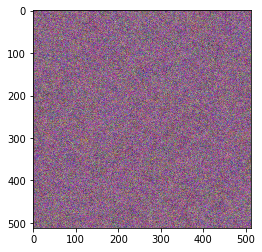

Iteration 00100  Loss 0.019865  PSNR 17.019193


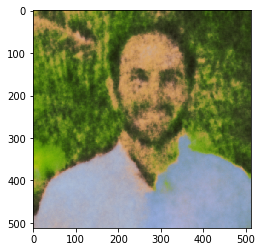

Iteration 00200  Loss 0.013387  PSNR 18.733135


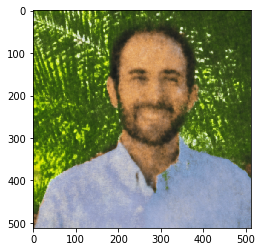

Iteration 00300  Loss 0.010875  PSNR 19.635696


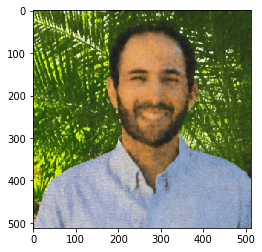

Iteration 00400  Loss 0.009166  PSNR 20.378324


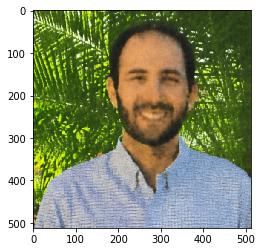

Iteration 00500  Loss 0.007014  PSNR 21.540301


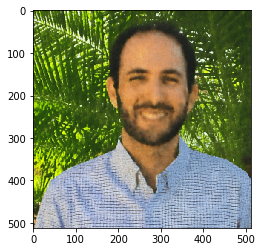

Iteration 00600  Loss 0.005462  PSNR 22.626540


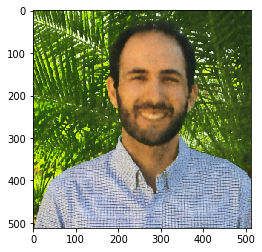

Iteration 00700  Loss 0.004469  PSNR 23.498043


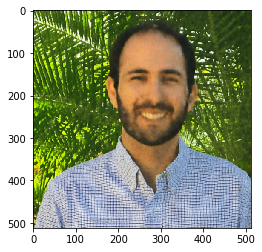

Iteration 00800  Loss 0.003784  PSNR 24.220448


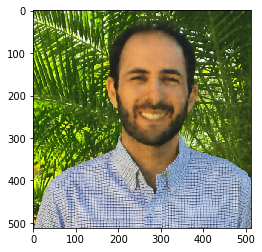

Iteration 00900  Loss 0.003216  PSNR 24.926486


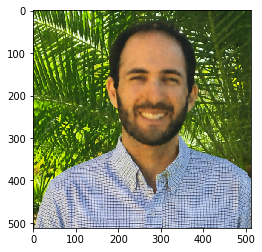

Iteration 01000  Loss 0.002805  PSNR 25.520476


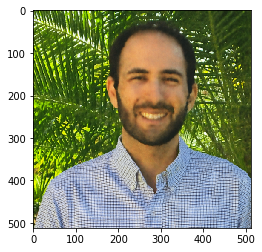

Iteration 01100  Loss 0.002487  PSNR 26.043903


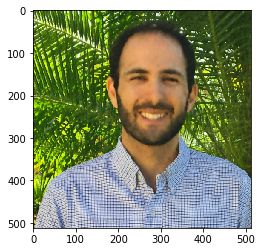

Iteration 01200  Loss 0.002203  PSNR 26.570079


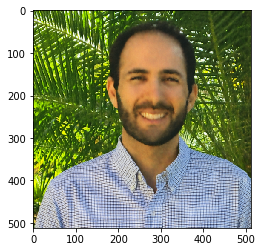

Iteration 01300  Loss 0.001967  PSNR 27.061696


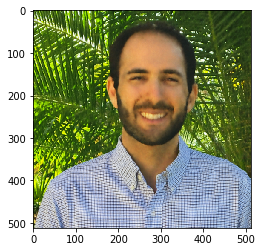

Iteration 01400  Loss 0.001797  PSNR 27.454678


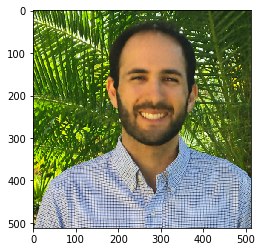

Iteration 01500  Loss 0.001636  PSNR 27.862535


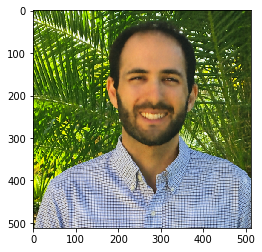

Iteration 01600  Loss 0.001458  PSNR 28.363420


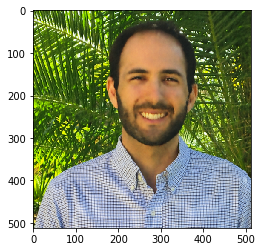

Iteration 01700  Loss 0.001391  PSNR 28.565250


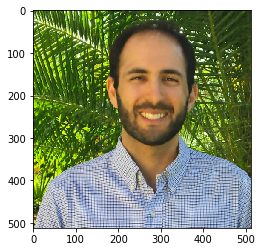

Iteration 01800  Loss 0.001273  PSNR 28.952587


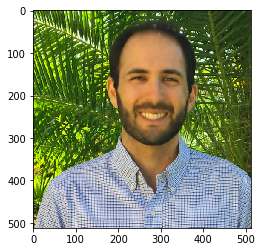

Iteration 01900  Loss 0.001132  PSNR 29.462197


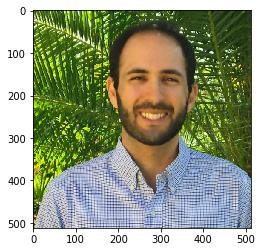

Iteration 02000  Loss 0.001096  PSNR 29.603808


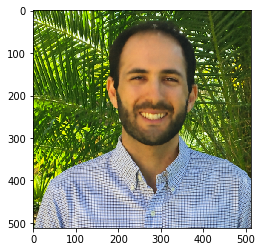

Iteration 02100  Loss 0.000955  PSNR 30.200003


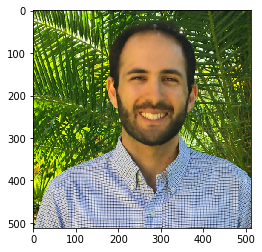

Iteration 02200  Loss 0.001006  PSNR 29.972020


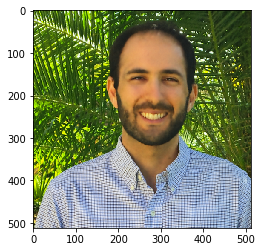

Iteration 02300  Loss 0.000859  PSNR 30.661890


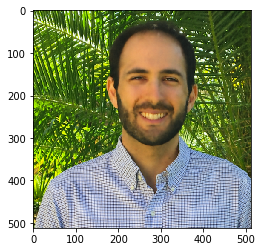

Iteration 02400  Loss 0.000828  PSNR 30.820506


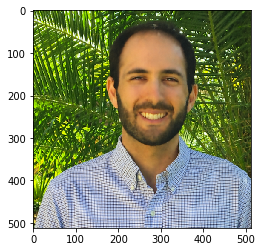

Iteration 02500  Loss 0.000717  PSNR 31.442212


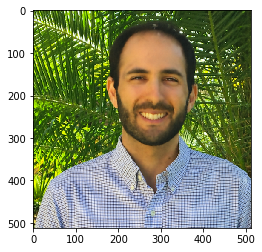

Iteration 02600  Loss 0.000687  PSNR 31.629358


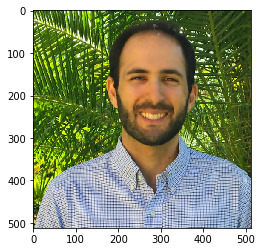

Iteration 02700  Loss 0.000671  PSNR 31.731989


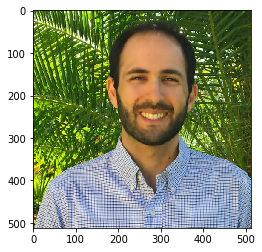

Iteration 02800  Loss 0.000591  PSNR 32.286140


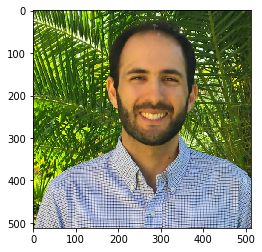

Iteration 02900  Loss 0.000622  PSNR 32.060764


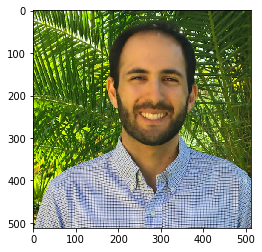

Iteration 03000  Loss 0.000556  PSNR 32.550458


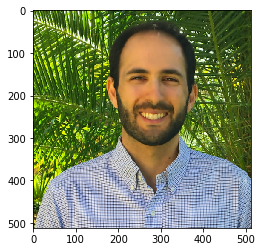

Iteration 03100  Loss 0.000521  PSNR 32.829656


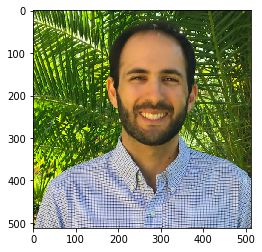

Iteration 03200  Loss 0.000462  PSNR 33.352280


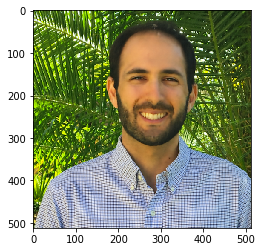

Iteration 03300  Loss 0.000471  PSNR 33.272534


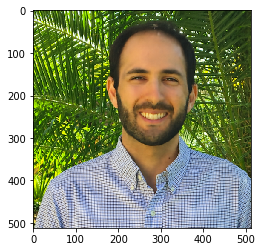

Iteration 03400  Loss 0.000516  PSNR 32.876485


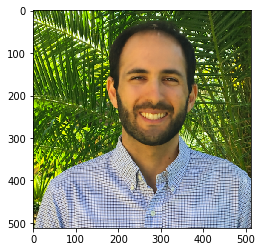

Iteration 03500  Loss 0.000400  PSNR 33.974163


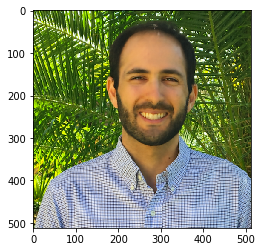

Iteration 03600  Loss 0.000369  PSNR 34.329942


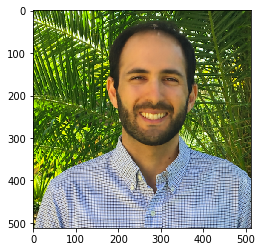

Iteration 03700  Loss 0.000353  PSNR 34.524025


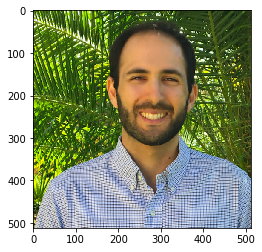

Iteration 03800  Loss 0.000328  PSNR 34.835698


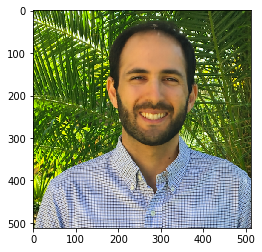

Iteration 03900  Loss 0.000329  PSNR 34.832221


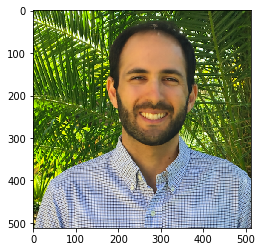

Iteration 04000  Loss 0.000324  PSNR 34.892316


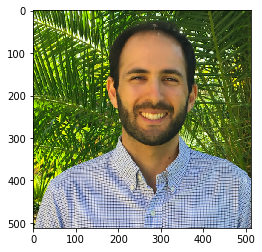

Iteration 04100  Loss 0.000354  PSNR 34.506558


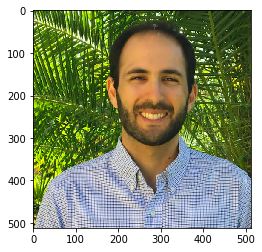

Iteration 04200  Loss 0.000281  PSNR 35.511506


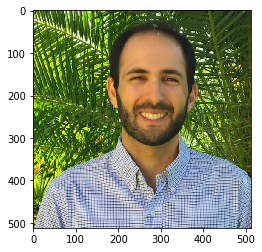

Iteration 04300  Loss 0.000294  PSNR 35.323116


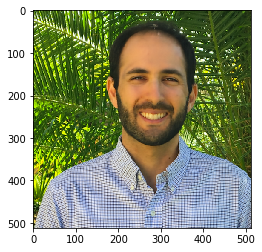

Iteration 04400  Loss 0.000296  PSNR 35.287580


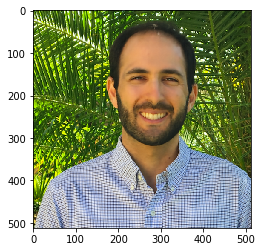

Iteration 04500  Loss 0.000240  PSNR 36.204021


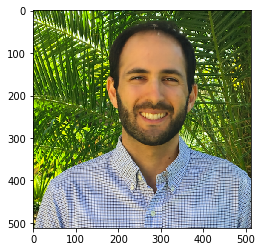

Iteration 04600  Loss 0.000240  PSNR 36.199657


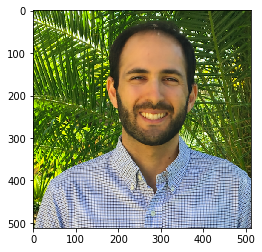

Iteration 04700  Loss 0.000242  PSNR 36.156323


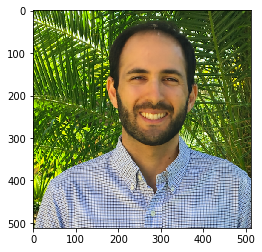

Iteration 04800  Loss 0.000258  PSNR 35.887755


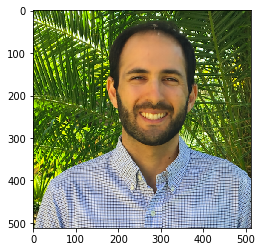

Iteration 04900  Loss 0.000199  PSNR 37.015353


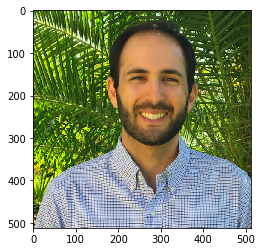

Iteration 05000  Loss 0.000200  PSNR 36.986078


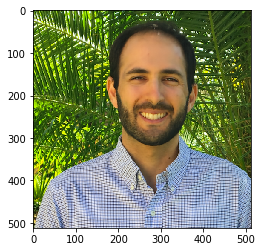

Iteration 05100  Loss 0.000257  PSNR 35.898591


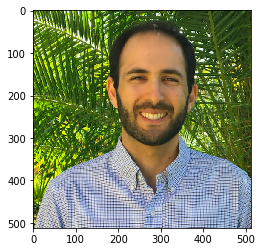

Iteration 05200  Loss 0.000175  PSNR 37.559493


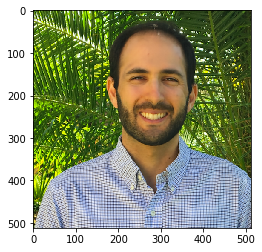

Iteration 05300  Loss 0.000329  PSNR 34.828956


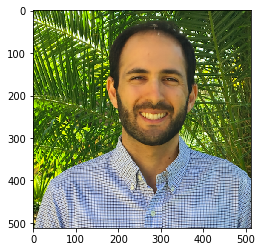

Iteration 05400  Loss 0.000169  PSNR 37.714127


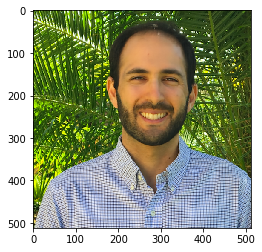

Iteration 05500  Loss 0.000165  PSNR 37.815685


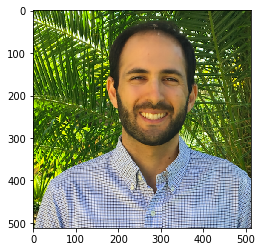

Iteration 05600  Loss 0.000163  PSNR 37.881927


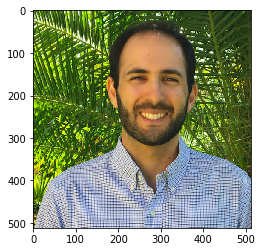

Iteration 05700  Loss 0.000155  PSNR 38.103047


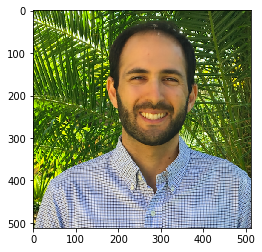

Iteration 05800  Loss 0.000142  PSNR 38.481167


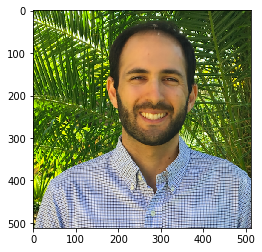

Iteration 05900  Loss 0.000165  PSNR 37.822098


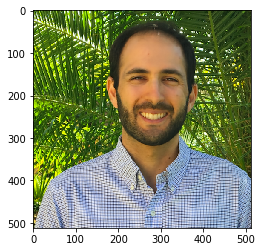

Iteration 06000  Loss 0.000152  PSNR 38.167341


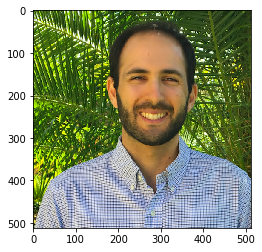

In [22]:
input_depth = 32
LR = 0.01 
num_iter = 6001
reg_noise_std = 0.03

model = skip(input_depth, img.shape[1], 
               c_down = [128] * 5,
               c_up =   [128] * 5,
               c_skip =    [128] * 5,  
               k_up = 3, k_down = 3, 
               upsample_mode='nearest', k_skip=1,
               act_fun='LeakyReLU').type(dtype)
print(model)

mse = torch.nn.MSELoss().type(dtype)

net_input = torch.zeros([1, input_depth, img.shape[2], img.shape[3]])
net_input = net_input.type(dtype)
net_input.uniform_() #net_input.normal_()
net_input *= 0.1           
noise = net_input.detach().clone()
net_input_saved = net_input.detach().clone()

params = [x for x in model.parameters()]
optimizer = torch.optim.Adam(params, lr=LR)
PSNR = []
for i in range(num_iter):
    optimizer.zero_grad()
    
    net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = model(net_input)

    loss = mse(out * mask, img * mask)
    loss.backward()
    
    optimizer.step()
    PSNR.append(10 * math.log10(1 / loss.item()))   
    if i % 100 == 0:
        print('Iteration %05d  Loss %f  PSNR %f' % (i, loss.item(), 10 * math.log10(1 / loss.item())))
        out = out.detach().cpu().numpy()[0]
        plt.figure()
        plt.imshow(out.transpose(1,2,0))
        plt.show()

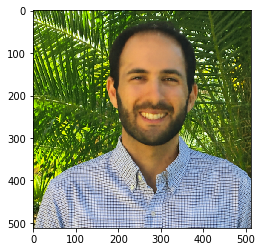

In [8]:
# out = out.detach().cpu().numpy()[0]
#         print(out.shape)
plt.figure()
plt.imshow(out.transpose(1,2,0))
plt.show()

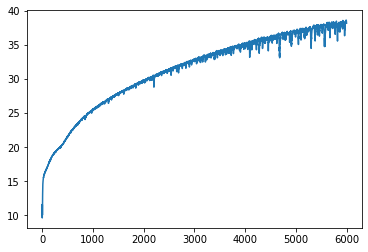

In [23]:
plt.plot(PSNR)